## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

## Camera Calibration to undistort images: ##
http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html
Once we find the corners, we can increase their accuracy using cv2.cornerSubPix(). 


Steps for calibration:
1. Find corners in chessboard by processing calibration image. These corners will be image points
2. Construct a 2D array which will be representing "object points" in real world
3. Find Camera Calibration Matrix (it will include distortion co-efficients etc.,)
4. Undistort raw image

In [1]:
%matplotlib inline
import mpld3
mpld3.enable_notebook()

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt


# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)


# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
i=0
for fname in images:
    #print(i)
    img = cv2.imread(fname)
    #print(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    #print(corners)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)

In [3]:
#Get calibration co-efficients
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

Before Calibration


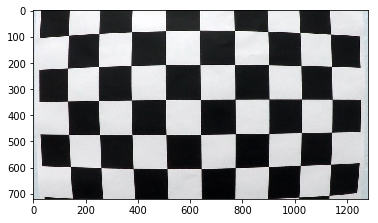

In [4]:
img = cv2.imread('../camera_cal/calibration1.jpg')
print("Before Calibration")
_=plt.imshow(img)

After applying calibration


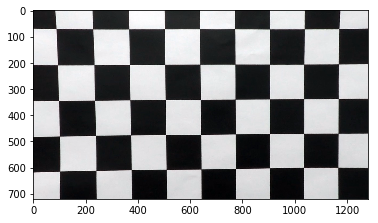

In [5]:
dst = cv2.undistort(img, mtx, dist,None,mtx)
print("After applying calibration")
_=plt.imshow(dst)

## Step 2: Color Thresholding to identify right and left lanes

In [6]:
#Read image of driving car

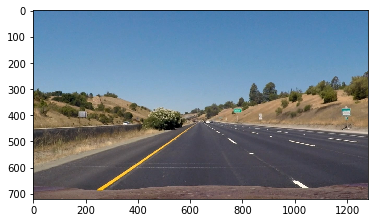

In [7]:
img = cv2.imread('../test_images/straight_lines1.jpg')
color_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(color_img)

After applying calibration


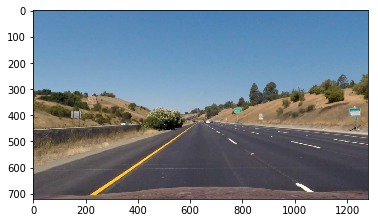

In [8]:
undist = cv2.undistort(color_img, mtx, dist,None,mtx)
print("After applying calibration")
_=plt.imshow(undist)

In [9]:
def abs_sobel_thresh(color_img,orient = 'x', thresh=(0,255),sobel_kernel=3):
    gray = cv2.cvtColor(color_img,cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    if orient == 'y':
        sobel = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    #print(orient)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(abs_sobel/np.max(abs_sobel)*255.0)
    binary = np.zeros_like(scaled_sobel)
    binary[(scaled_sobel>= thresh[0]) & (scaled_sobel<= thresh[1])] = 1
    return binary

In [10]:
def mag_thresh(img,thresh=(0,255),sobel_kernel=3):
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize = sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize = sobel_kernel)
    #Perform grad mag operation
    abs_sobel = np.sqrt(sobelx**2 + sobely**2)
    scale_sobel = np.uint8(abs_sobel/np.max(abs_sobel)*255)
    binary = np.zeros_like(abs_sobel)
    binary[(abs_sobel >= thresh[0]) & (abs_sobel <= thresh[1])] = 1
    #print(binary)
    return binary

In [11]:
def dir_thresh(img,thresh=(0,np.pi),sobel_kernel=3):
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize = sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize = sobel_kernel)
    #Important: Take absolute of image before performing angle operation
    dir_sobel = np.absolute(np.arctan(np.absolute(sobely),np.absolute(sobelx)))
    
    binary_output = np.zeros_like(dir_sobel)
    binary_output[(dir_sobel>=thresh[0]) & (dir_sobel<=thresh[1])] = 1
    
    return binary_output

In [12]:
gradx_img= abs_sobel_thresh(undist,orient= 'x',thresh=(0,255))
grady_img= abs_sobel_thresh(undist,orient= 'y',thresh=(0,255))
mag_img = mag_thresh(undist,thresh=(10,128))
angle_img = dir_thresh(undist,thresh=(.5,2))

combined_img = np.zeros_like(angle_img)
combined_img[((mag_img==1) & (angle_img==1))] = 1

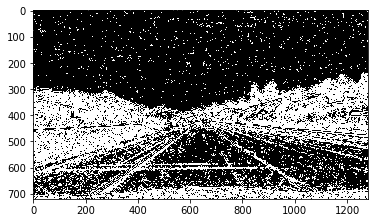

In [13]:
_=plt.imshow(combined_img,cmap='gray')

In [14]:
mpld3.disable_notebook()

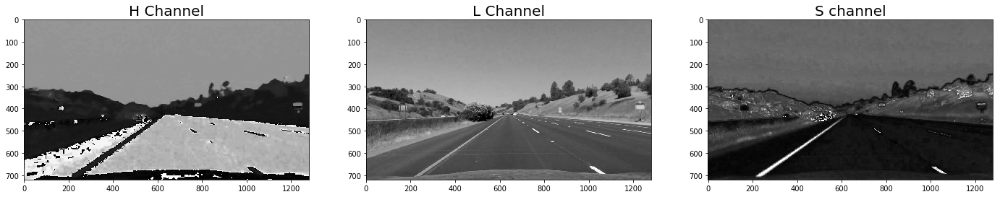

In [15]:
hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(24, 18))
_=ax1.imshow(H,cmap='gray')
_=ax1.set_title('H Channel',fontsize=20)
_=ax2.imshow(L,cmap='gray')
_=ax2.set_title('L Channel',fontsize=20)
_=ax3.imshow(S,cmap='gray')
_=ax3.set_title('S channel',fontsize=20)



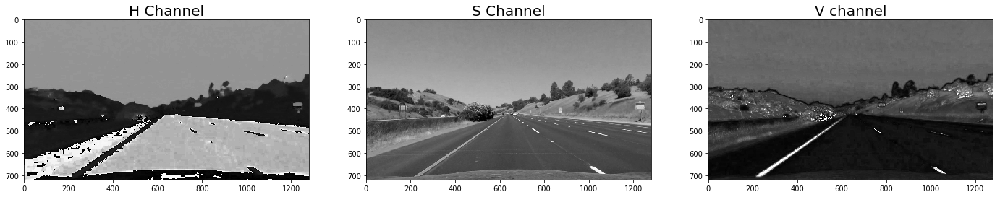

In [16]:
hsv = cv2.cvtColor(undist, cv2.COLOR_RGB2HSV)
H1 = hls[:,:,0]
S1 = hls[:,:,1]
V1 = hls[:,:,2]

f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(24, 18))
_=ax1.imshow(H1,cmap='gray')
_=ax1.set_title('H Channel',fontsize=20)
_=ax2.imshow(S1,cmap='gray')
_=ax2.set_title('S Channel',fontsize=20)
_=ax3.imshow(V1,cmap='gray')
_=ax3.set_title('V channel',fontsize=20)


In [17]:
mpld3.enable_notebook()

In [18]:
def warper(img, src, dst):
    #Warp perspective example code
    #http://docs.opencv.org/3.1.0/da/d6e/tutorial_py_geometric_transformations.html
    
    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)  # keep same size as input image

    return warped

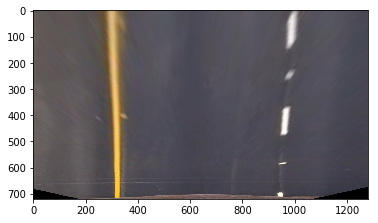

In [21]:
#from udacity
src_pts = np.float32([[585,460],[203,720],[1127,720],[695,460]])
dst_pts = np.float32([[320,0],[320,720],[960,720],[960,0]])

warped_out = warper(undist,src_pts,dst_pts)
_=plt.imshow(warped_out,cmap='gray')